<a href="https://colab.research.google.com/github/MLenthusiastic/context_contrastive_loss/blob/master/Context_contrastive_model_GPU.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%load_ext tensorboard

In [0]:
import os
logs_base_dir = "runs"
os.makedirs(logs_base_dir, exist_ok=True)

In [0]:
!kill 351

In [24]:
import shutil
shutil.make_archive('runs', 'zip', 'runs')

'/content/runs.zip'

In [0]:
!unzip runs.zip -d runs

In [23]:
%tensorboard --logdir {logs_base_dir}

<IPython.core.display.Javascript object>

Epoch :  1 Loss :  0.13598808990075037
Epoch :  2 Loss :  0.1346009992636167
Epoch :  3 Loss :  0.132969703238744
Epoch :  4 Loss :  0.13314461364195898
Epoch :  5 Loss :  0.1330099254846573
Epoch :  6 Loss :  0.13207621070054862
Epoch :  7 Loss :  0.12917916018229264
Epoch :  8 Loss :  0.12923830174482787
Epoch :  9 Loss :  0.12681805514372313
Epoch :  10 Loss :  0.12665132891673309
Epoch :  11 Loss :  0.1247582257940219
Epoch :  12 Loss :  0.12498888144126305
Epoch :  13 Loss :  0.12461882944290455
Epoch :  14 Loss :  0.12499828865894905
Epoch :  15 Loss :  0.12110538264879814
Epoch :  16 Loss :  0.12264626702437034
Epoch :  17 Loss :  0.11814800535257046
Epoch :  18 Loss :  0.11980557441711426
Epoch :  19 Loss :  0.11854025091116245
Epoch :  20 Loss :  0.11573055558479749
Epoch :  21 Loss :  0.1110934724028294
Epoch :  22 Loss :  0.1115967923632035
Epoch :  23 Loss :  0.11377399815962864
Epoch :  24 Loss :  0.1071184346309075
Epoch :  25 Loss :  0.10628359936750852
Epoch :  26 Loss 

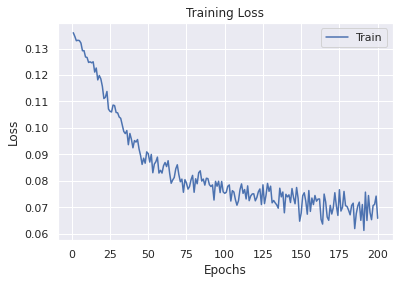

In [22]:
from torch.utils.data import Dataset
import json
import numpy as np
import torch.nn as nn
import cv2
import matplotlib.pyplot as plt
import seaborn as sns;sns.set()
from google.colab.patches import cv2_imshow
from IPython.display import Image, display
import torch
import math
import torch.nn.functional as F
from argparse import ArgumentParser
import copy
import torch.nn.functional as F
from PIL import Image
import random

from torch.utils.tensorboard import SummaryWriter
import tensorflow as tf
import tensorboard as tb
tf.io.gfile = tb.compat.tensorflow_stub.io.gfile


parser = ArgumentParser(description='context contrastive loss')
parser.add_argument('--batch_size', type=int, default=16)
parser.add_argument('--constractive_loss_margin', type=float, default=0.8)
parser.add_argument('--learning_rate', type=float, default=1e-5)
parser.add_argument('--num_epochs', type=int, default=200)
parser.add_argument('--weight_decay', type=float, default=1e-5)
parser.add_argument('--mode', type=str, default='train')
parser.add_argument('--device', type=str, default='cuda')
parser.add_argument('--img_size', type=int, default=200)
parser.add_argument('--no_of_samples_per_class', type=int, default=100)
parser.add_argument('--no_of_classes', type=int, default=50)
parser.add_argument('--projector_img_size', type=int, default=32)
parser.add_argument('--number_of_positive_pairs_per_class', type=int, default=5)

args, unknown = parser.parse_known_args()

DEVICE = args.device
if not torch.cuda.is_available():
    DEVICE = 'cpu'

#previous trained encoder model
class Encoder(nn.Module):

    def __init__(self):
        super(Encoder, self).__init__()

        #conv and fc works as encoder
        self.conv = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=32, kernel_size=5),
                                  nn.ReLU(),
                                  nn.MaxPool2d(kernel_size=2, stride=2),
                                  nn.Conv2d(in_channels=32, out_channels=64, kernel_size=5),
                                  nn.ReLU(),
                                  nn.MaxPool2d(kernel_size=2, stride=2),
                                  nn.Conv2d(in_channels=64, out_channels=128, kernel_size=5),
                                  nn.ReLU(),
                                  nn.MaxPool2d(kernel_size=2, stride=2)
                                  )
        
        # output 128, 21, 21 
        self.fc = nn.Sequential(nn.Linear(128 * 21 * 21, 1024),
                                nn.ReLU(),
                                nn.Linear(1024, 1024),
                                nn.ReLU(),
                                nn.Linear(1024, 128)
                                )
        
    def forward(self, x):
        x = self.conv(x)
        x = x.view(x.size()[0], -1)
        z = self.fc(x)
        return z

class ContextDavis(Dataset):

  def __init__(self, json_data, memmap):
      self.memmap = memmap
      self.json_data = json_data
      self.shape = self.json_data["shape"]
      self.objects = self.json_data["objects"]
      self.contexts = self.json_data["contexts"]
      self.keys_of_images = list(self.contexts.keys())
      self.keys_of_images.sort()
      self.start_img_index = int(self.keys_of_images[0])
      self.length = len(self.keys_of_images)

  def __getitem__(self, index):
      correct_index = self.start_img_index + index
  
      contexts_per_image = self.contexts[str(correct_index)]
  
      img_objects = []
      img_classes = []

      for context_image in contexts_per_image:
        img_object = self.objects[str(context_image)]
        img_object_width = img_object['width']
        img_object_height = img_object['height']
        image_ =  self.memmap[context_image, :, :img_object_width, :img_object_height].astype(np.float32)
        class_ = img_object['class']

        image_tensor_ext = torch.from_numpy(image_).unsqueeze(dim=0)
        image_tensor = F.interpolate(image_tensor_ext, size=(args.img_size,args.img_size))
        image_tensor = image_tensor.squeeze(dim=1)

        img_objects.append(image_tensor)
        img_classes.append(class_)

      return img_objects,img_classes

  
  def __len__(self):
      return self.length


class Context_Model(nn.Module):

   def __init__(self):
        super(Context_Model, self).__init__()

        self.fc = nn.Sequential(nn.Linear(256, 256),
                                nn.ReLU(),
                                nn.Linear(256, 128)
                                )
   
   def forward(self,concat_zs):
     pair_img_tensor_1 = concat_zs[0]
     pair_img_tensor_2 = concat_zs[1]
     context_aggregated_z1 = self.fc(pair_img_tensor_1)
     context_aggregated_z2 = self.fc(pair_img_tensor_2)
     return context_aggregated_z1, context_aggregated_z2
        
class ContrastiveLoss(nn.Module):

    def __init__(self, margin):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output, target):
        eq_distance = F.pairwise_distance(output[0], output[1])
        loss = 0.5 * (1 - target) * torch.pow(eq_distance, 2) + \
               0.5 * target * torch.pow(torch.clamp(self.margin - eq_distance, min=0.00), 2)

        return loss.mean()

def collate_for_same_order(batch):
    data = [item[0] for item in batch]
    target = [item[1] for item in batch]
    return [data, target]

def draw_loss_plot(training_losses, epochs):
    plt.plot(epochs, training_losses, label="Train")
    #plt.plot(epochs, validation_losses, label="eval")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.legend()
    plt.show()

folder_path = './drive/My Drive/'
with open(folder_path+'test_davis.json') as json_file:
    davis_json = json.load(json_file)

shape = davis_json["shape"]
memmap_path = folder_path+'test_davis.mmap'
davis_memmap = np.memmap(memmap_path, dtype='uint8', mode='r', shape=tuple(shape))

davis_dataset = ContextDavis(davis_json,davis_memmap)
davis_dataloader = torch.utils.data.DataLoader(davis_dataset, batch_size=args.batch_size, shuffle=True, collate_fn=collate_for_same_order)


#load previously trained encoder model
model_path = './drive/My Drive/encoder_3.pth'
encoder_model = Encoder()
#encoder_model.load_state_dict(torch.load(model_path, map_location='cpu'))
encoder_model.load_state_dict(torch.load(model_path))
encoder_model = encoder_model.to(DEVICE)
encoder_model.eval()
#torch.load(load_path, map_location=map_location)

tensorboard_writer = SummaryWriter()

context_model = Context_Model()
context_model = context_model.to(DEVICE)
context_model.train()

criterion = ContrastiveLoss(margin=args.constractive_loss_margin)
optimizer = torch.optim.Adam(params=context_model.parameters(), lr=args.learning_rate, weight_decay=args.weight_decay)

epoches = []
epoch_training_losses = []

for epoch in range(1,args.num_epochs+1):

  context_aggregated_zs_of_epoch = []
  context_aggregated_labels_of_epoch = []

  classes_dict = {}
  projector_labels = []
  projector_imgs = []
  projector_embeddings = []
  counter = 0
  g_counter = 0

  batch_losses = []
  epoches.append(epoch)

  for batch in davis_dataloader:

      batch_img_objects, batch_classes = batch[0] , batch[1]

      batch_z_vectors = []

      #getting embedding vectors for img_objects
      torch.set_grad_enabled(False)
      for img_objects in batch_img_objects: #groups
        z_vectors = []
        for single_img_object in img_objects:
          single_img_object = single_img_object.to(DEVICE)
          z_vectors.append(encoder_model(single_img_object.squeeze(dim=1)))
        batch_z_vectors.append(z_vectors)
      
      #batch_z_vectors  [[a,b,c] [c,d] [e,f,g]]

      #getting avg vectors and labels for context classes 
      batch_processed_z_vector_pairs = []
      batch_processed_class_labels = []

      for z_vectors, classes in zip(batch_z_vectors, batch_classes):
        Z_vector_pair = []
        classes_pair = []
        for single_zs, class_ in zip(z_vectors, classes):
          main_z = single_zs
          avg_z = torch.mean(torch.stack(z_vectors), dim=0)
          Z_vector_pair.append(main_z)
          Z_vector_pair.append(avg_z)
        
          classes_pair.append(class_)
          temp_classes = copy.deepcopy(classes)
          temp_classes.remove(class_)
          avg_class_label = ''
          for temp_clz in temp_classes:
              if temp_clz not in avg_class_label:
                avg_class_label = avg_class_label+'-'+temp_clz
          context_class_label = class_+'-in'+avg_class_label
          classes_pair.append(context_class_label)
        
        batch_processed_z_vector_pairs.append(Z_vector_pair)
        batch_processed_class_labels.append(classes_pair)
        
        #batch_processed_z_vector_pairs  [[mz,az,mz,az,mz,az], [mz,az,mz,az,mz,az]]
        #batch_processed_class_labels [['person', 'person-in-horse', 'horse', 'horse-in-person-horse', 'horse', 'horse-in-person-horse'],[...]]

      
      tensor_main_avg_z = torch.Tensor()
      tensor_main_avg_z = tensor_main_avg_z.to(DEVICE)
      context_aggregated_labels = [] 

      #getting context aggregated zs from model and the aggregated class lables for them
      for processed_z_vector_pairs, processed_class_label_pairs in zip(batch_processed_z_vector_pairs, batch_processed_class_labels):
        for main_z_idx, avg_z_idx in zip( range(0,len(processed_class_label_pairs),2) , range(1,len(processed_class_label_pairs),2) ):
            context_aggregated_labels.append(processed_class_label_pairs[avg_z_idx])
            main_z = processed_z_vector_pairs[main_z_idx]
            avg_z =  processed_z_vector_pairs[avg_z_idx]
            main_z = main_z.to(DEVICE)
            avg_z = avg_z.to(DEVICE)
            concat_main_avg = torch.cat((main_z,avg_z),dim=1)  
            concat_main_avg = concat_main_avg.to(DEVICE)
            tensor_main_avg_z = torch.cat((tensor_main_avg_z,concat_main_avg))  

      #create context_labels with context_zs
      class_labels_with_context = {}
      for class_idx, class_label in enumerate(context_aggregated_labels):
        if class_label not in list(class_labels_with_context.keys()):
         class_labels_with_context[class_label] = [tensor_main_avg_z[class_idx]]
        else:
          current_z_list = class_labels_with_context.get(class_label)
          current_z_list.append(tensor_main_avg_z[class_idx])
          class_labels_with_context[class_label] = current_z_list

    
      #create similiar, disimilar pairs
      context_z_pair_img_1 = []
      context_z_pair_img_2 = []
      targets = []
      class_lables = []
      total_positive_pairs = 0

      #similiar pairs
      for class_label in list(class_labels_with_context.keys()):
        z_vectors = class_labels_with_context.get(class_label)
        counter_per_class = 0
        if len(z_vectors) > 2:
          while counter_per_class < args.number_of_positive_pairs_per_class:
            selected_two = random.choices(z_vectors, k=2)
            context_z_pair_img_1.append(selected_two[0]) 
            context_z_pair_img_2.append(selected_two[1]) 
            targets.append(0)
            class_lables.append([class_label,class_label])
            counter_per_class += 1
            total_positive_pairs += 1

      #dissimilar pairs
      counter_dissimilar_pair = 0
      while counter_dissimilar_pair < total_positive_pairs:
        pair_keys = np.random.choice(list(class_labels_with_context.keys()), size=2, replace=False)
        context_z_pair_1 = random.choices(class_labels_with_context.get(pair_keys[0]), k=1)
        context_z_pair_2 = random.choices(class_labels_with_context.get(pair_keys[1]), k=1)
        context_z_pair_img_1.append(context_z_pair_1[0])
        context_z_pair_img_2.append(context_z_pair_2[0])
        class_lables.append(pair_keys.tolist())
        targets.append(1)
        counter_dissimilar_pair += 1

      #pass to model
      context_model = context_model.to(DEVICE)
      context_model.train()
      torch.set_grad_enabled(True)
     
      tensor_context_z_pair_img_1 = torch.stack(context_z_pair_img_1,dim=0) 
      tensor_context_z_pair_img_2 = torch.stack(context_z_pair_img_2,dim=0) 

      tensor_context_z_pair_img_1 = tensor_context_z_pair_img_1.to(DEVICE)
      tensor_context_z_pair_img_2 = tensor_context_z_pair_img_2.to(DEVICE)

      tensor_context_z_pair = [tensor_context_z_pair_img_1,tensor_context_z_pair_img_2]

      g_counter += len(tensor_context_z_pair_img_1)

      context_aggregated_z1, context_aggregated_z2 = context_model(tensor_context_z_pair)

      out = [context_aggregated_z1, context_aggregated_z2 ]

      tensor_target = torch.FloatTensor(targets)
      tensor_target = tensor_target.to(DEVICE)
  
      loss = criterion(out, tensor_target)

      
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      batch_losses.append(loss.item())

      #if args.num_epochs > 12:
        #args.learning_rate = 1e-5

      #adding to tensorboard projector

      context_model.eval()
      torch.set_grad_enabled(False)

      #pass data again to model to embeddings for the projector

      context_aggregated_z1, context_aggregated_z2 = context_model(tensor_context_z_pair)

      
      for pair_idx, class_pairs in enumerate(class_lables):
        for class_idx,single_class in enumerate(class_pairs):
          if len(classes_dict.keys()) < args.no_of_classes:
            if single_class not in classes_dict.keys():
              classes_dict[single_class] = 1
              projector_labels.append(single_class)
              if class_idx == 0:
                projector_embeddings.append(context_aggregated_z1.cpu()[pair_idx])
              else:
                projector_embeddings.append(context_aggregated_z2.cpu()[pair_idx])
            else:
              current_count = classes_dict.get(single_class)
              if current_count <= args.no_of_samples_per_class:
                classes_dict[single_class] = current_count+1
                projector_labels.append(single_class)
                if class_idx == 0:
                  projector_embeddings.append(context_aggregated_z1.cpu()[pair_idx])
                else:
                  projector_embeddings.append(context_aggregated_z2.cpu()[pair_idx])

  epoch_training_losses.append(np.mean(batch_losses))     
  print('Epoch : ', epoch,'Loss : ', np.mean(batch_losses) )

  tensorboard_writer.add_embedding(
                    mat=torch.FloatTensor(np.stack(projector_embeddings)),
                    #label_img=torch.FloatTensor(np.stack(projector_imgs)),
                    metadata=projector_labels,
                    global_step=epoch, tag=f'train_emb_{epoch}')

draw_loss_plot(epoch_training_losses, epoches)



      
  
